In [1]:
!ls ../data

audio                      test_file_ids.csv
feature_shapes.csv         train_file_ids.csv
features                   xeno-canto_ca-nv_index.csv


In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
import librosa
import pandas as pd
import numpy as np
from librosa.display import specshow
from IPython.display import Audio
from matplotlib import pyplot as plt

In [4]:
training_data = pd.read_csv("../data/train_file_ids.csv")
training_data.head(3)

,file_id,label
0,453098,43
1,344803,78
2,355425,56


In [5]:
training_data['file_path']=[ "../data/audio/XC%s.mp3"%file_id 
                            for file_id in training_data['file_id'] ]
training_data.head(3)

,file_id,label,file_path
0,453098,43,../data/audio/XC453098.mp3
1,344803,78,../data/audio/XC344803.mp3
2,355425,56,../data/audio/XC355425.mp3


In [6]:
data, sr = librosa.load(training_data.iloc[0]['file_path'], None)
print("Loaded audio %i samples long at sample rate %i hz (%.2f s)"%(
        data.shape[0], sr, (data.shape[0]/sr)))

Loaded audio 1764864 samples long at sample rate 48000 hz (36.77 s)


In [151]:
df_index = pd.read_csv("../data/xeno-canto_ca-nv_index.csv", index_col='file_id')
display(df_index.head(3))
df_index.loc[453098]

,Unnamed: 0,country,duration_seconds,english_cname,file_name,file_url,genus,latitude,license,location,longitude,recordist,recordist_url,sonogram_url,species,type,remarks,full_name
file_id,,,,,,,,,,,,,,,,,,
17804,0,United States,3,Abert's Towhee,XC17804.mp3,https://www.xeno-canto.org/17804/download,Melozone,33.3117,http://creativecommons.org/licenses/by-nc-nd/2.5/,"Cibola National Wildlife Refuge, Cibola, Arizo...",-114.68912,Nathan Pieplow,https://www.xeno-canto.org/contributor/EKKJJJRDJY,https://www.xeno-canto.org/sounds/uploaded/EKK...,aberti,'seet' call,XC17804 © Nathan Pieplow // Cibola National Wi...,Abert's Towhee (Melozone aberti)
177367,1,United States,4,Abert's Towhee,XC177367.mp3,https://www.xeno-canto.org/177367/download,Melozone,34.2850,http://creativecommons.org/licenses/by-nc-sa/4.0/,"Bill Williams River NWR, Arizona, United States",-114.06900,Lauren Harter,https://www.xeno-canto.org/contributor/YQNGFTBRRT,https://www.xeno-canto.org/sounds/uploaded/YQN...,aberti,call,XC177367 © Lauren Harter // Bill Williams Rive...,Abert's Towhee (Melozone aberti dumeticola)
145505,2,United States,4,Abert's Towhee,XC145505.mp3,https://www.xeno-canto.org/145505/download,Melozone,34.2850,http://creativecommons.org/licenses/by-nc-sa/3.0/,"Bill Williams River NWR, Arizona, United States",-114.06900,Lauren Harter,https://www.xeno-canto.org/contributor/YQNGFTBRRT,https://www.xeno-canto.org/sounds/uploaded/YQN...,aberti,Squeal duet,XC145505 © Lauren Harter // Bill Williams Rive...,Abert's Towhee (Melozone aberti dumeticola)


Unnamed: 0                                                       1301
country                                                 United States
duration_seconds                                                   36
english_cname                                            Lark Sparrow
file_name                                                XC453098.mp3
file_url                   https://www.xeno-canto.org/453098/download
genus                                                      Chondestes
latitude                                                      33.0333
license             http://creativecommons.org/licenses/by-nc-sa/4.0/
location            Ramona Grasslands, Wild Flower Loop, San Diego...
longitude                                                    -116.951
recordist                                                 Paul Marvin
recordist_url       https://www.xeno-canto.org/contributor/RFTXRYBVBX
sonogram_url        https://www.xeno-canto.org/sounds/uploaded/RFT...
species             

Spectrogram shape: (128, 6895)


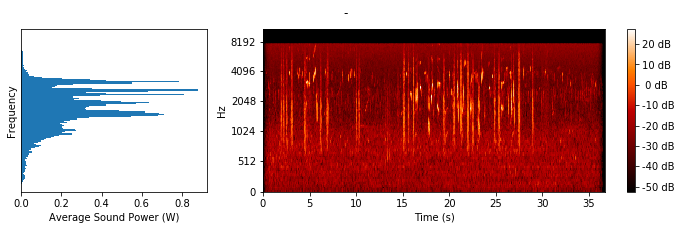

In [163]:
def vis_sample(data, sr, title=""):
    hz_lbls = [512, 1024, 2048, 4096, 8192]
    lbl_idx = np.searchsorted(librosa.display.__coord_mel_hz(128), hz_lbls)
    
    #plt.figure(figsize=(12,4))
    msg = librosa.feature.melspectrogram(data, sr, n_fft=n_fft, hop_length=hop_length)
    print("Spectrogram shape:",msg.shape)
    
    #fig, (means_ax, sg_ax) = plt.subplots(1,2,figsize=(12,3))
    fig = plt.figure(figsize=(12,3))
    fig.suptitle(title)
    gs = fig.add_gridspec(1,3)
    sg_ax = fig.add_subplot(gs[1:])
    means_ax = fig.add_subplot(gs[0])
    plt.subplots_adjust(wspace=.3)
    
    specshow(librosa.power_to_db(msg), x_axis='s', y_axis='mel', cmap='gist_heat',
             sr=sr, hop_length=hop_length, ax=sg_ax )
    plt.colorbar(sg_ax.collections[0], format='%2.f dB', ax=sg_ax)
    means_ax.barh(np.arange(128), np.mean(msg, axis=1), height=1)
    means_ax.set_xlabel('Average Sound Power (W)')
    means_ax.set_ylabel('Frequency')
    #means_ax.yaxis.set_label_position("right")
    #means_ax.set_yticks(lbl_idx)
    means_ax.set_yticks([])
    means_ax.set_yticklabels(hz_lbls)
    plt.show()
    #return fig
vis_sample(data, sr, "-");

Loaded ../data/audio/XC453098.mp3, 1764864 samples long at sample rate 48000 hz (36.77 s)
Spectrogram shape: (128, 6895)


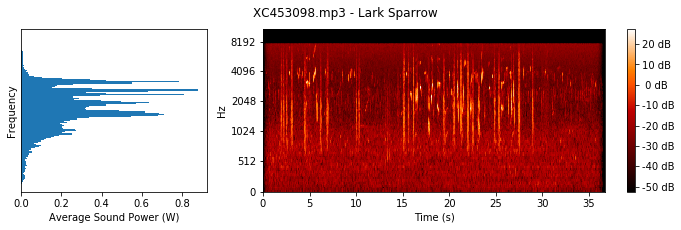

Loaded ../data/audio/XC344803.mp3, 746496 samples long at sample rate 48000 hz (15.55 s)
Spectrogram shape: (128, 2917)


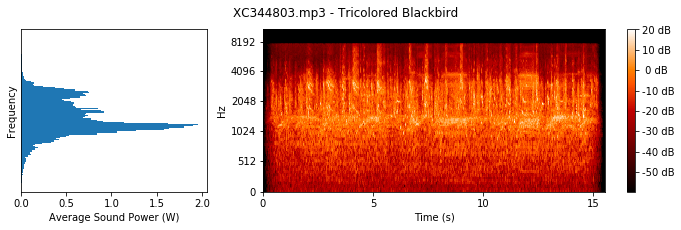

Loaded ../data/audio/XC355425.mp3, 281861 samples long at sample rate 44100 hz (6.39 s)
Spectrogram shape: (128, 1102)


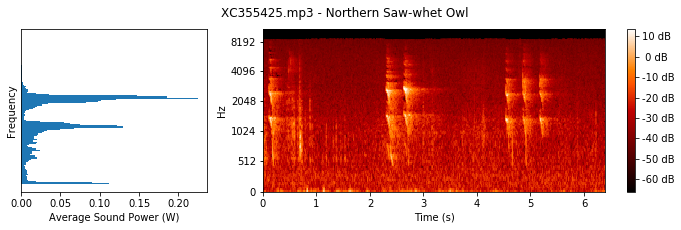

Loaded ../data/audio/XC451191.mp3, 1521792 samples long at sample rate 48000 hz (31.70 s)
Spectrogram shape: (128, 5945)


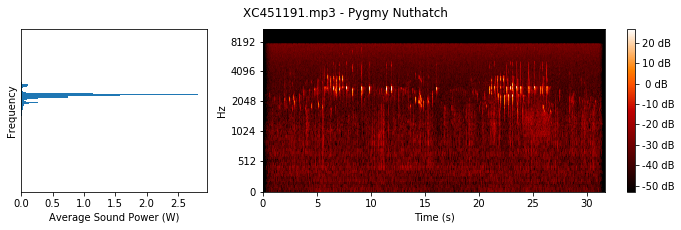

Loaded ../data/audio/XC219357.mp3, 1647360 samples long at sample rate 48000 hz (34.32 s)
Spectrogram shape: (128, 6436)


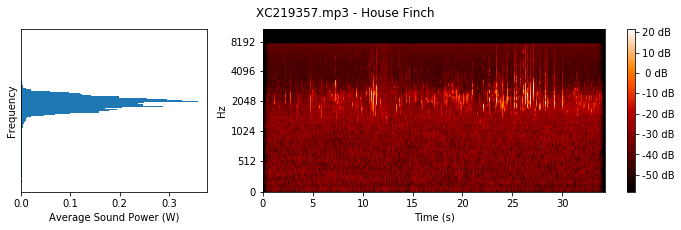

In [165]:
hop_length = 256
n_fft = 2048

for i in range (5):
    data, sr = librosa.load(training_data.iloc[i]['file_path'], None)
    print("Loaded %s, %i samples long at sample rate %i hz (%.2f s)"%(
            training_data.iloc[i]['file_path'],
            data.shape[0], sr, (data.shape[0]/sr)))
    label = df_index.loc[training_data.iloc[i]['file_id']]['english_cname']
    vis_sample(data, sr, "XC%s.mp3 - %s"%(training_data.iloc[i]['file_id'], label ))
    display(Audio(data, rate=sr))

In [ ]:
ax.g